In [130]:
import pandas as pd
import cv2
import numpy as np
import rasterio

In [143]:

img16=cv2.imread('20180911_062749_0f40_3B_AnalyticMS.tif',cv2.IMREAD_UNCHANGED)
print (img16.shape) 


(4300, 8377, 4)


In [139]:
WIDTH = 2
def from_16_to_8(img16):
    mean = np.mean(img16)
    std = np.std(img16)

    m = max(0, mean - WIDTH*std)
    M = min(img16.max(), mean + WIDTH*std)

    print('min=' + str(m) + 
         '\n max=' + str(M) + 
         '\n mean=' + str(mean)+
         '\n std=' + str(std))

    img8 = ((img16 - m)*255.0/(M-m)).clip(1, 255).astype(np.uint8)
    return img8

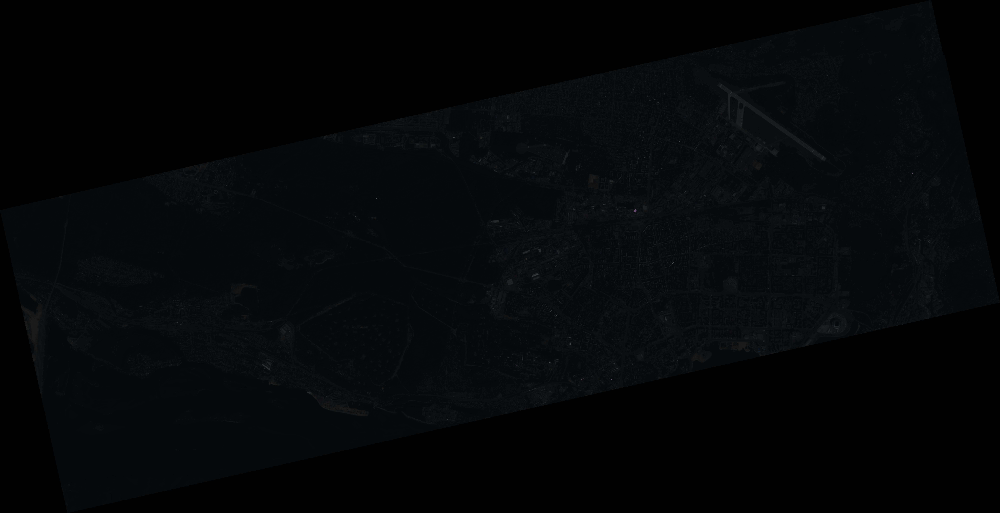

In [140]:
Image.fromarray((img8[:,:,:3]).astype('uint8'), mode='RGB')

(array([5.7113472e+07, 4.4942163e+07, 5.4127540e+06, 5.0501300e+05,
        6.1160000e+04, 1.8029000e+04, 4.6920000e+03, 2.2280000e+03,
        1.2640000e+03, 9.0000000e+02, 3.7800000e+02, 2.2200000e+02,
        4.3300000e+02, 2.6000000e+02, 2.5800000e+02, 5.0000000e+01,
        1.3000000e+01, 7.0000000e+00, 3.0000000e+00, 1.0000000e+00]),
 array([  0.  ,   7.85,  15.7 ,  23.55,  31.4 ,  39.25,  47.1 ,  54.95,
         62.8 ,  70.65,  78.5 ,  86.35,  94.2 , 102.05, 109.9 , 117.75,
        125.6 , 133.45, 141.3 , 149.15, 157.  ]),
 <a list of 20 Patch objects>)

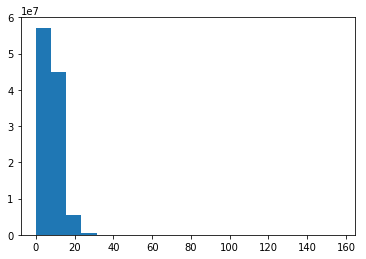

In [141]:
plt.hist((img8[:,:,:3]).flatten(), bins=20)